In [130]:
from fdlite import FaceDetection, FaceLandmark, face_detection_to_roi
from fdlite import IrisLandmark, iris_roi_from_face_landmarks
from fdlite.examples.iris_recoloring import recolor_iris
from fdlite.transform import bbox_from_landmarks
from PIL import Image
from imutils import paths
from matplotlib import pyplot as plt

import re
import pandas as pd

In [131]:
detect_faces = FaceDetection()
detect_face_landmarks = FaceLandmark()
detect_iris = IrisLandmark()

In [132]:
def calculate_distance(known_width, focal_length, pixel_width):
    return (known_width * focal_length) / pixel_width

In [133]:
def calculate_focal_length(known_distance, known_width, pixel_width):
    return (pixel_width * known_distance) / known_width

In [134]:
KNOWN_DISTANCE = 11.0
KNOWN_WIDTH = 0.4645669

In [135]:
calibration_files = []
for image_path in sorted(paths.list_images("calibration")):
    if ".ipynb" not in image_path:
        calibration_files.append(image_path)
        
calibration_files

['calibration/calibration_11_IN_1.png',
 'calibration/calibration_11_IN_2.png',
 'calibration/calibration_11_IN_3.png',
 'calibration/calibration_11_IN_4.png',
 'calibration/calibration_11_IN_5.png']

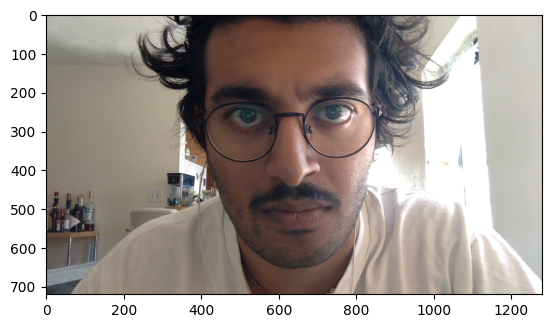

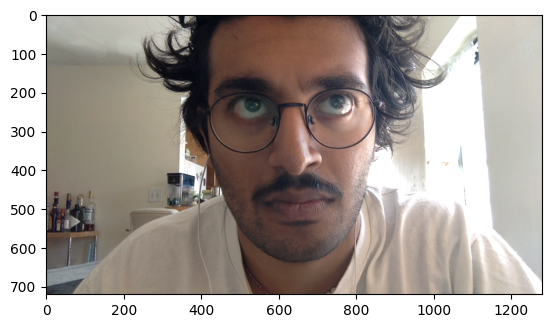

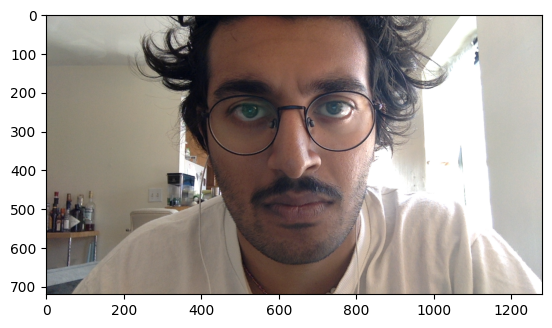

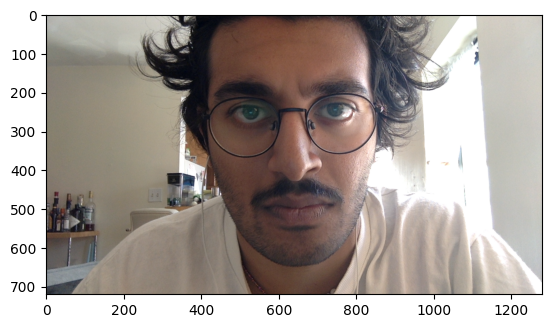

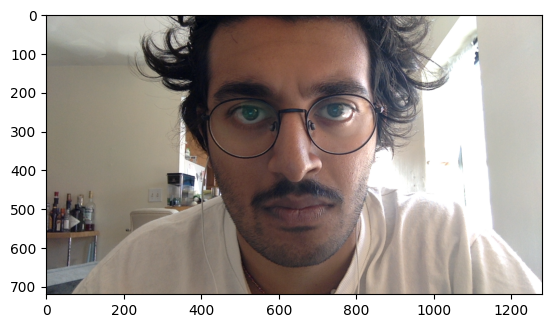

901.0410374754086
1039.0005335248977


In [136]:
avg_right_focal_length = 0
avg_left_focal_length = 0

for calibration_file in calibration_files:
    img = Image.open(calibration_file)
    # face detections
    face_detections = detect_faces(img)
    # face roi
    face_roi = face_detection_to_roi(face_detections[0], img.size)
    # detect face landmarks
    face_landmarks = detect_face_landmarks(img, face_roi)
    # get ROI for both eyes
    eye_roi = iris_roi_from_face_landmarks(face_landmarks, img.size)
    # left eye, right eye
    left_eye_roi, right_eye_roi = eye_roi
    
    left_eye_results = detect_iris(img, left_eye_roi)
    right_eye_results = detect_iris(img, right_eye_roi)
    
    right_eye_bbox = bbox_from_landmarks(right_eye_results.iris).absolute(img.size)
    left_eye_bbox = bbox_from_landmarks(left_eye_results.iris).absolute(img.size)
    
    right_pixel_width = right_eye_bbox.xmax - right_eye_bbox.xmin
    left_pixel_width = left_eye_bbox.xmax - left_eye_bbox.xmin
    
    right_focal_length = calculate_focal_length(KNOWN_DISTANCE, KNOWN_WIDTH, right_pixel_width)
    left_focal_length = calculate_focal_length(KNOWN_DISTANCE, KNOWN_WIDTH, left_pixel_width)
    
    avg_right_focal_length += right_focal_length
    avg_left_focal_length += left_focal_length
    
    plt.imshow(img)
    plt.show()
    
avg_right_focal_length = avg_right_focal_length / len(calibration_images)
avg_left_focal_length = avg_left_focal_length / len(calibration_images)

print(avg_right_focal_length)
print(avg_left_focal_length)

In [137]:
def extract_number(string):
    match = re.search(r'iris_(\d+)_IN', string)
    if match:
        return int(match.group(1))
    else:
        return 0

test_files = []
for image_path in sorted(paths.list_images("scripts")):
    if ".ipynb" not in image_path and "iris" in image_path:
        test_files.append(image_path)
        
        
test_files = sorted(test_files, key=extract_number)
test_files

['scripts/iris_4_IN_1.png',
 'scripts/iris_4_IN_2.png',
 'scripts/iris_4_IN_3.png',
 'scripts/iris_4_IN_4.png',
 'scripts/iris_4_IN_5.png',
 'scripts/iris_6_IN_1.png',
 'scripts/iris_6_IN_2.png',
 'scripts/iris_6_IN_3.png',
 'scripts/iris_6_IN_4.png',
 'scripts/iris_6_IN_5.png',
 'scripts/iris_8_IN_1.png',
 'scripts/iris_8_IN_2.png',
 'scripts/iris_8_IN_3.png',
 'scripts/iris_8_IN_4.png',
 'scripts/iris_8_IN_5.png',
 'scripts/iris_10_IN_1.png',
 'scripts/iris_10_IN_2.png',
 'scripts/iris_10_IN_3.png',
 'scripts/iris_10_IN_4.png',
 'scripts/iris_10_IN_5.png',
 'scripts/iris_14_IN_1.png',
 'scripts/iris_14_IN_2.png',
 'scripts/iris_14_IN_3.png',
 'scripts/iris_14_IN_4.png',
 'scripts/iris_14_IN_5.png',
 'scripts/iris_18_IN_1.png',
 'scripts/iris_18_IN_2.png',
 'scripts/iris_18_IN_3.png',
 'scripts/iris_18_IN_4.png',
 'scripts/iris_18_IN_5.png']

test_file:  scripts/iris_4_IN_1.png
actual_distance:  4 inches
predicted_right_distance:  5.719836700993097
predicted_left_distance:  4.531721249798095
avg_predicted_distance:  5.125778975395596 



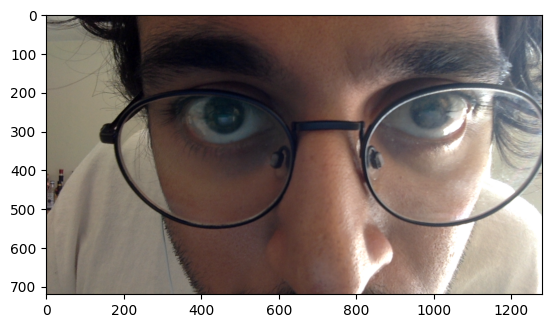

test_file:  scripts/iris_4_IN_2.png
actual_distance:  4 inches
predicted_right_distance:  5.454873112848785
predicted_left_distance:  4.990965122856122
avg_predicted_distance:  5.222919117852453 



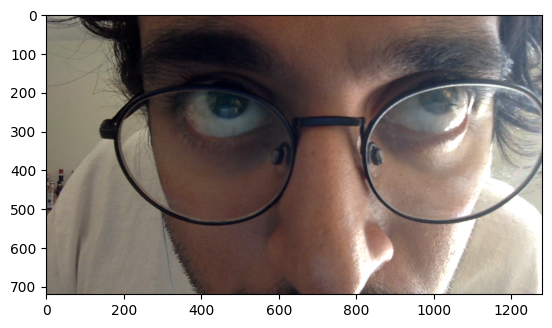

test_file:  scripts/iris_4_IN_3.png
actual_distance:  4 inches
predicted_right_distance:  5.421631214784454
predicted_left_distance:  4.588274345589227
avg_predicted_distance:  5.004952780186841 



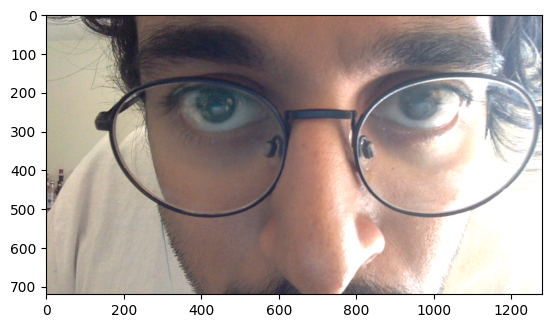

test_file:  scripts/iris_6_IN_1.png
actual_distance:  6 inches
predicted_right_distance:  6.366729948013369
predicted_left_distance:  5.97250927621235
avg_predicted_distance:  6.169619612112859 



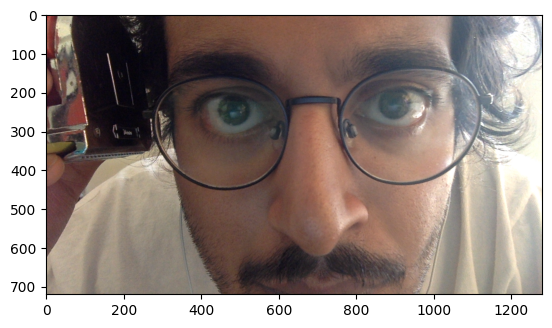

test_file:  scripts/iris_6_IN_2.png
actual_distance:  6 inches
predicted_right_distance:  6.243996180717175
predicted_left_distance:  6.098486476221873
avg_predicted_distance:  6.171241328469524 



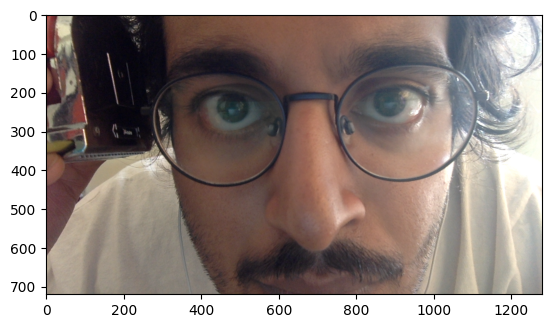

test_file:  scripts/iris_6_IN_3.png
actual_distance:  6 inches
predicted_right_distance:  6.271295295093923
predicted_left_distance:  6.1322328244182325
avg_predicted_distance:  6.201764059756078 



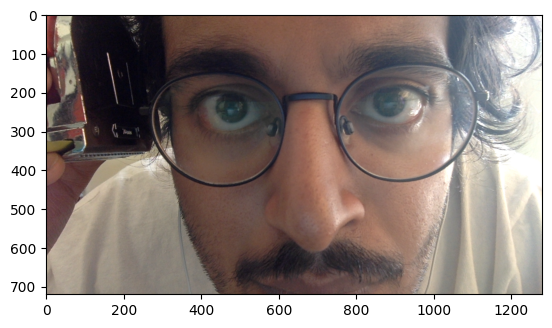

test_file:  scripts/iris_6_IN_4.png
actual_distance:  6 inches
predicted_right_distance:  5.9548013670902025
predicted_left_distance:  6.035819266550879
avg_predicted_distance:  5.995310316820541 



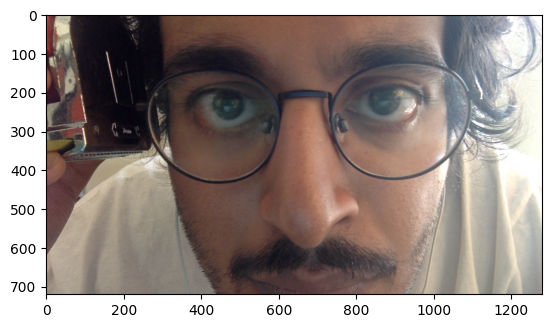

test_file:  scripts/iris_6_IN_5.png
actual_distance:  6 inches
predicted_right_distance:  6.2922533143722195
predicted_left_distance:  5.7548973894597815
avg_predicted_distance:  6.0235753519160005 



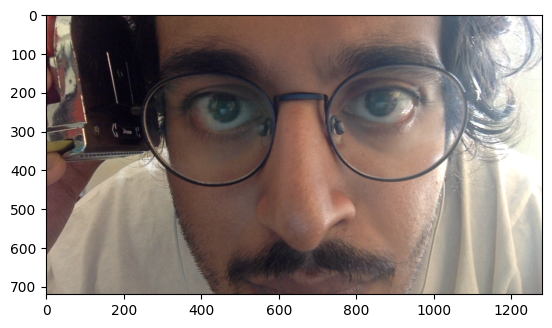

test_file:  scripts/iris_8_IN_1.png
actual_distance:  8 inches
predicted_right_distance:  7.428248119445664
predicted_left_distance:  7.678297452988019
avg_predicted_distance:  7.553272786216842 



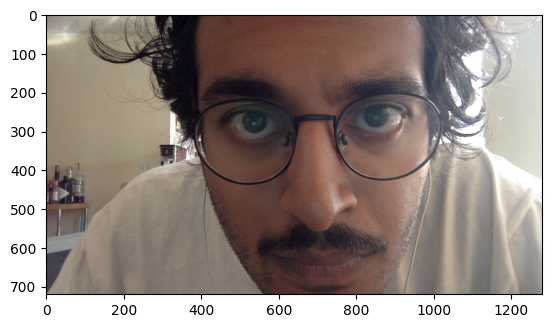

test_file:  scripts/iris_8_IN_2.png
actual_distance:  8 inches
predicted_right_distance:  7.709018407752586
predicted_left_distance:  7.806908389340214
avg_predicted_distance:  7.7579633985464 



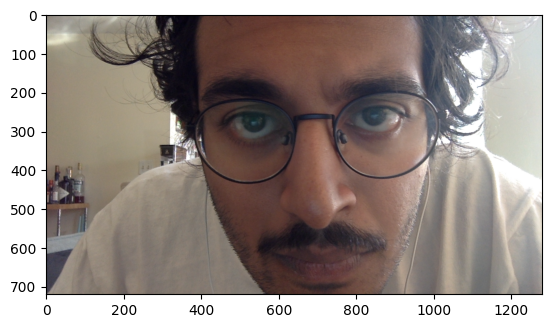

test_file:  scripts/iris_8_IN_3.png
actual_distance:  8 inches
predicted_right_distance:  7.841821575684121
predicted_left_distance:  7.567276994069761
avg_predicted_distance:  7.704549284876942 



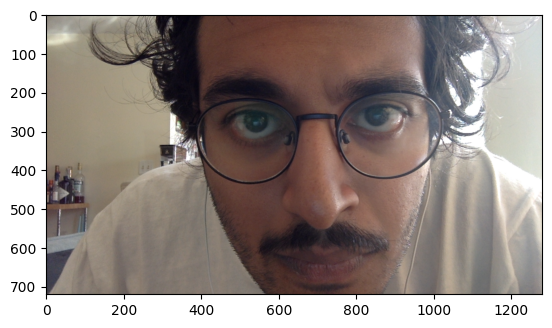

test_file:  scripts/iris_8_IN_4.png
actual_distance:  8 inches
predicted_right_distance:  7.94044470945109
predicted_left_distance:  7.537696152311056
avg_predicted_distance:  7.739070430881073 



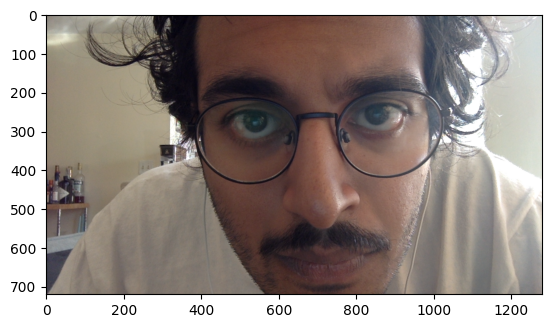

test_file:  scripts/iris_8_IN_5.png
actual_distance:  8 inches
predicted_right_distance:  7.912423584721993
predicted_left_distance:  7.609238871913726
avg_predicted_distance:  7.760831228317859 



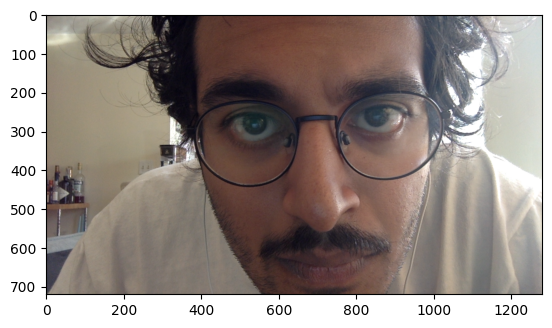

test_file:  scripts/iris_10_IN_1.png
actual_distance:  10 inches
predicted_right_distance:  9.645502299481036
predicted_left_distance:  9.140540025110056
avg_predicted_distance:  9.393021162295547 



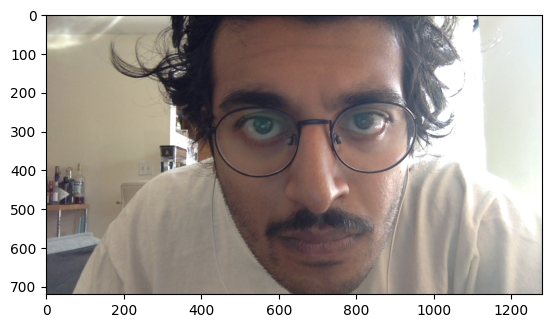

test_file:  scripts/iris_10_IN_2.png
actual_distance:  10 inches
predicted_right_distance:  9.845873291604457
predicted_left_distance:  9.028845801184646
avg_predicted_distance:  9.437359546394552 



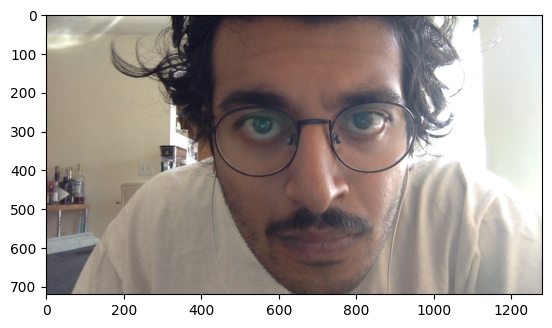

test_file:  scripts/iris_10_IN_3.png
actual_distance:  10 inches
predicted_right_distance:  10.22656531917749
predicted_left_distance:  9.724768242051981
avg_predicted_distance:  9.975666780614736 



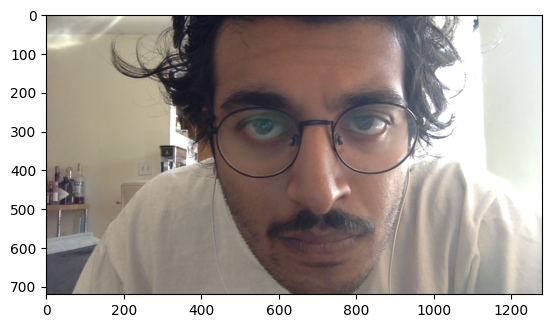

test_file:  scripts/iris_10_IN_4.png
actual_distance:  10 inches
predicted_right_distance:  9.61172412464109
predicted_left_distance:  9.109991446764026
avg_predicted_distance:  9.360857785702557 



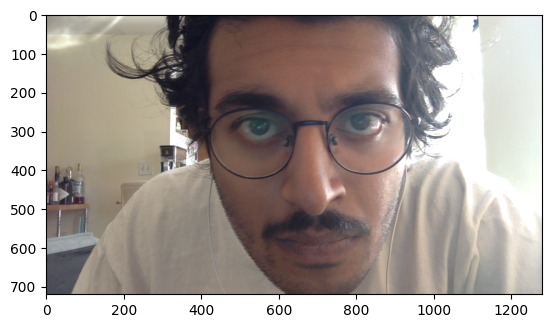

test_file:  scripts/iris_10_IN_5.png
actual_distance:  10 inches
predicted_right_distance:  9.559340779962055
predicted_left_distance:  9.049179207055515
avg_predicted_distance:  9.304259993508785 



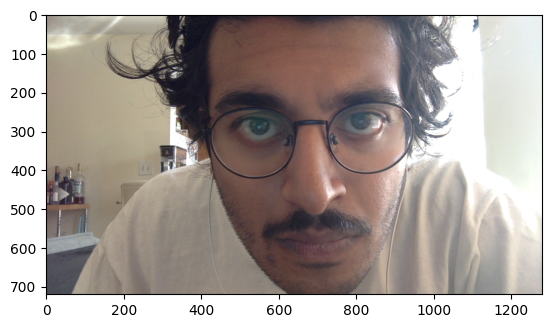

test_file:  scripts/iris_14_IN_1.png
actual_distance:  14 inches
predicted_right_distance:  13.107195038629317
predicted_left_distance:  13.056354049508322
avg_predicted_distance:  13.08177454406882 



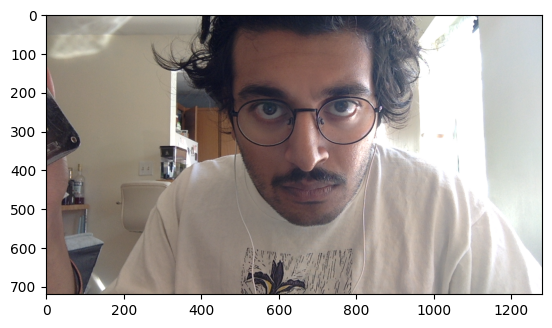

test_file:  scripts/iris_14_IN_2.png
actual_distance:  14 inches
predicted_right_distance:  13.47262842549848
predicted_left_distance:  13.47433612298164
avg_predicted_distance:  13.473482274240059 



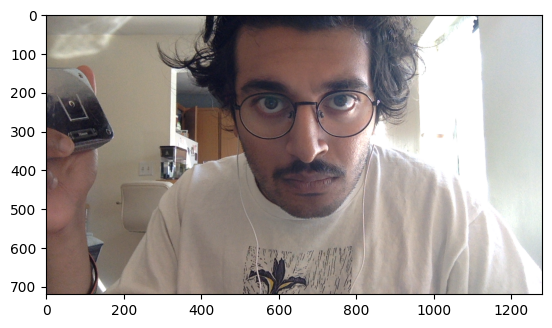

test_file:  scripts/iris_14_IN_3.png
actual_distance:  14 inches
predicted_right_distance:  13.250048178979476
predicted_left_distance:  13.3590637372383
avg_predicted_distance:  13.304555958108889 



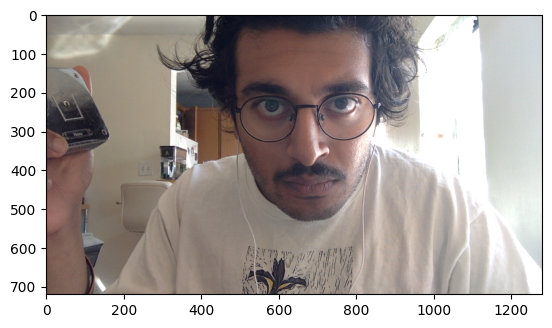

test_file:  scripts/iris_14_IN_4.png
actual_distance:  14 inches
predicted_right_distance:  13.312288636280922
predicted_left_distance:  13.286806024439239
avg_predicted_distance:  13.299547330360081 



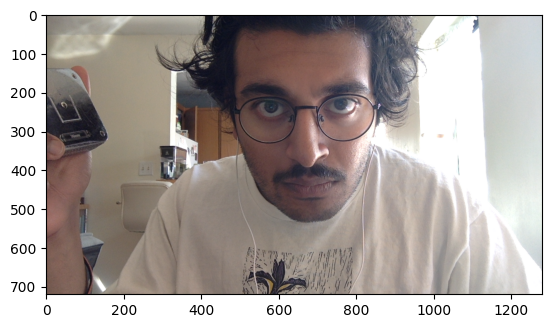

test_file:  scripts/iris_14_IN_5.png
actual_distance:  14 inches
predicted_right_distance:  13.193048789285115
predicted_left_distance:  13.141320477242893
avg_predicted_distance:  13.167184633264004 



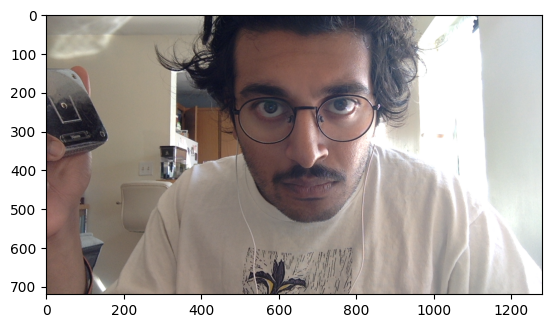

test_file:  scripts/iris_18_IN_1.png
actual_distance:  18 inches
predicted_right_distance:  18.801614721655845
predicted_left_distance:  17.718488790556343
avg_predicted_distance:  18.260051756106094 



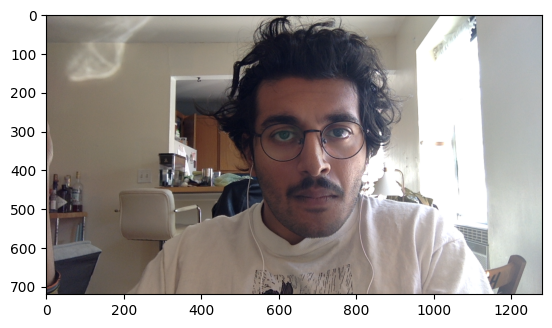

test_file:  scripts/iris_18_IN_2.png
actual_distance:  18 inches
predicted_right_distance:  18.42282356496483
predicted_left_distance:  17.79508843185347
avg_predicted_distance:  18.10895599840915 



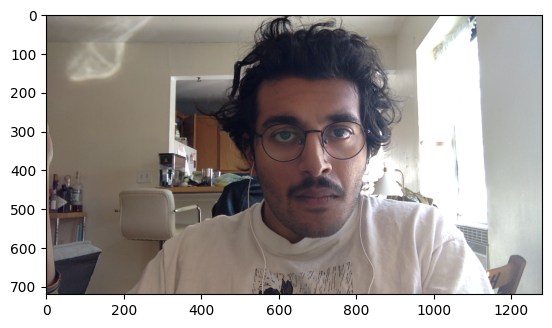

test_file:  scripts/iris_18_IN_3.png
actual_distance:  18 inches
predicted_right_distance:  18.85388342508402
predicted_left_distance:  17.632441350863626
avg_predicted_distance:  18.243162387973825 



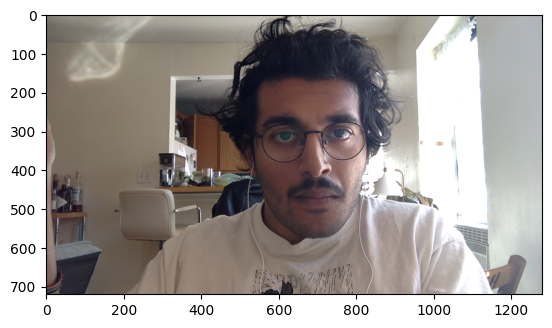

test_file:  scripts/iris_18_IN_4.png
actual_distance:  18 inches
predicted_right_distance:  18.240003989361703
predicted_left_distance:  17.81342654901144
avg_predicted_distance:  18.02671526918657 



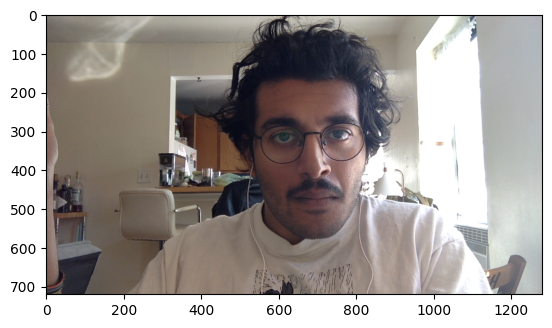

test_file:  scripts/iris_18_IN_5.png
actual_distance:  18 inches
predicted_right_distance:  17.643877889009307
predicted_left_distance:  17.782709039829893
avg_predicted_distance:  17.7132934644196 



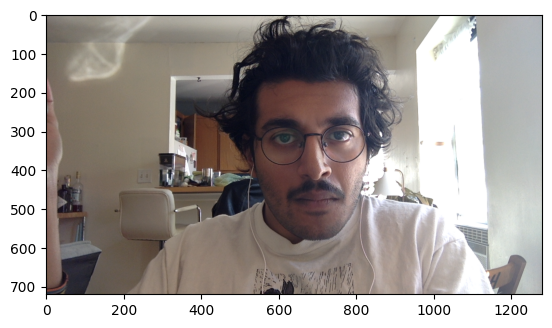

In [142]:
image_to_predictions = {}

for test_file in test_files:
    
    img = Image.open(test_file)

    face_detections = detect_faces(img)
    if not face_detections:
        continue 
        
    face_roi = face_detection_to_roi(face_detections[0], img.size)
    # detect face landmarks
    face_landmarks = detect_face_landmarks(img, face_roi)
    if not face_landmarks:
        continue
        
    # get ROI for both eyes
    eye_roi = iris_roi_from_face_landmarks(face_landmarks, img.size)
    # left eye, right eye
    left_eye_roi, right_eye_roi = eye_roi
    
    left_eye_results = detect_iris(img, left_eye_roi)
    right_eye_results = detect_iris(img, right_eye_roi)
    
    right_eye_bbox = bbox_from_landmarks(right_eye_results.iris).absolute(img.size)
    left_eye_bbox = bbox_from_landmarks(left_eye_results.iris).absolute(img.size)
    
    right_pixel_width = right_eye_bbox.xmax - right_eye_bbox.xmin
    left_pixel_width = left_eye_bbox.xmax - left_eye_bbox.xmin

    right_distance = calculate_distance(KNOWN_WIDTH, avg_right_focal_length, right_pixel_width)
    left_distance = calculate_distance(KNOWN_WIDTH, avg_left_focal_length, left_pixel_width)
    
    actual_distance = str(extract_number(test_file)) + " inches"
    
    print("test_file: ", test_file)
    print("actual_distance: ", actual_distance) 
    print("predicted_right_distance: ", right_distance)
    print("predicted_left_distance: ", left_distance)
    print("avg_predicted_distance: ", (left_distance + right_distance) / 2, "\n")
          
    predictions = {
        "actual_distance": actual_distance,
        "predicted_right_distance": right_distance,
        "predicted_left_distance": left_distance,
        "avg_predicted_distance": (left_distance + right_distance) / 2
    }
    
    image_to_predictions[test_file] = predictions
    
    plt.imshow(img)
    plt.show()
    
    

In [144]:
df = pd.DataFrame.from_dict(image_to_predictions).T
df.head(50)

,actual_distance,predicted_right_distance,predicted_left_distance,avg_predicted_distance
scripts/iris_4_IN_1.png,4 inches,5.719837,4.531721,5.125779
scripts/iris_4_IN_2.png,4 inches,5.454873,4.990965,5.222919
scripts/iris_4_IN_3.png,4 inches,5.421631,4.588274,5.004953
scripts/iris_6_IN_1.png,6 inches,6.36673,5.972509,6.16962
scripts/iris_6_IN_2.png,6 inches,6.243996,6.098486,6.171241
scripts/iris_6_IN_3.png,6 inches,6.271295,6.132233,6.201764
scripts/iris_6_IN_4.png,6 inches,5.954801,6.035819,5.99531
scripts/iris_6_IN_5.png,6 inches,6.292253,5.754897,6.023575
scripts/iris_8_IN_1.png,8 inches,7.428248,7.678297,7.553273
scripts/iris_8_IN_2.png,8 inches,7.709018,7.806908,7.757963
